In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px


In [2]:
data = pd.read_csv(r'C:\Users\Tejas\Downloads\covid_19_india.csv')

In [3]:

data1 = pd.DataFrame(data)

In [4]:
# creating active cases new column 
# creating recovery rate new column
data1['Active'] = data1['Confirmed'] - (data1['Cured'] + data1['Deaths'])
data1['Recovery Rate'] = data1['Cured']*100/data1['Confirmed']
data1.replace('Bihar****','Bihar',inplace=True)
data1.replace('Telengana','Telangana',inplace=True)
data1.replace('-','0',inplace=True)

In [5]:
data1

,Sno,Date,Time,State/UnionTerritory,ConfirmedIndianNational,ConfirmedForeignNational,Cured,Deaths,Confirmed,Active,Recovery Rate
0,1,2020-01-30,6:00 PM,Kerala,1,0,0,0,1,1,0.000000
1,2,2020-01-31,6:00 PM,Kerala,1,0,0,0,1,1,0.000000
2,3,2020-02-01,6:00 PM,Kerala,2,0,0,0,2,2,0.000000
3,4,2020-02-02,6:00 PM,Kerala,3,0,0,0,3,3,0.000000
4,5,2020-02-03,6:00 PM,Kerala,3,0,0,0,3,3,0.000000
...,...,...,...,...,...,...,...,...,...,...,...
16845,16846,2021-07-07,8:00 AM,Telangana,0,0,613124,3703,628282,11455,97.587389
16846,16847,2021-07-07,8:00 AM,Tripura,0,0,63964,701,68612,3947,93.225675
16847,16848,2021-07-07,8:00 AM,Uttarakhand,0,0,332006,7338,340882,1538,97.396166
16848,16849,2021-07-07,8:00 AM,Uttar Pradesh,0,0,1682130,22656,1706818,2032,98.553566


In [6]:
#top 10 Date by Deaths State
top_10_deaths_state = data1.groupby(['State/UnionTerritory'])['Deaths'].sum()
top_10 = top_10_deaths_state.sort_values(ascending=False).head(10)
pd.DataFrame(top_10)

,Deaths
State/UnionTerritory,
Maharashtra,19314532
Karnataka,4819018
Tamil Nadu,4731627
Delhi,4066907
Uttar Pradesh,3347656
West Bengal,3214840
Andhra Pradesh,2475816
Punjab,2216735
Gujarat,1866811


In [7]:
#top 10 Date by Active State
top_10_active_state = data1.groupby(['State/UnionTerritory'])['Active'].sum()
top_10 = top_10_active_state.sort_values(ascending=False).head(10)
pd.DataFrame(top_10)

,Active
State/UnionTerritory,
Maharashtra,75789031
Karnataka,37129391
Kerala,31863648
Tamil Nadu,21030571
Andhra Pradesh,18243068
Uttar Pradesh,16966587
West Bengal,11311169
Rajasthan,10525506
Chhattisgarh,9997112


In [8]:
#top 10 Date by Cured State
top_10_cured_state = data1.groupby(['State/UnionTerritory'])['Cured'].sum()
top_10 = top_10_cured_state.sort_values(ascending=False).head(10)
pd.DataFrame(top_10)

,Cured
State/UnionTerritory,
Maharashtra,813788907
Karnataka,345648926
Tamil Nadu,317067499
Kerala,311127643
Andhra Pradesh,303427899
Uttar Pradesh,232529439
Delhi,224062704
West Bengal,195296839
Odisha,117984789


In [9]:
px.scatter(x='State/UnionTerritory',y='Date',data_frame=data1,color='Cured',title='Date wise Cured Cases')

In [10]:
px.scatter(x='State/UnionTerritory',y='Date',data_frame=data1,color='Deaths',title='Date wise and Deaths Cases')

In [11]:
px.scatter(x='State/UnionTerritory',y='Date',data_frame=data1,color='Active',title='Date wise Active Cases')

In [12]:
px.scatter(x='State/UnionTerritory',y='Date',color='Recovery Rate',data_frame=data1,title='Date wise and Recovery Rate')

In [13]:
px.scatter(x='State/UnionTerritory',y='Date',color='Confirmed',data_frame=data1,title='Date wise Confirmed Cases')

In [14]:
px.scatter(x='State/UnionTerritory',y='ConfirmedForeignNational',data_frame=data1,color='Deaths',title='ConfirmedForeignNational Cases and Deaths')

In [15]:
fig = px.histogram(x='State/UnionTerritory',y='Deaths',data_frame=data1,title='State wise all Deaths')
fig.update_traces(marker_line_width=1,marker_line_color='red')

In [16]:
fig = px.histogram(x='Deaths',y='Cured',data_frame=data1,title='Sum of Deaths Cases and Cured Cases')
fig.update_traces(marker_line_width=1,marker_line_color='red')

In [17]:
data1

,Sno,Date,Time,State/UnionTerritory,ConfirmedIndianNational,ConfirmedForeignNational,Cured,Deaths,Confirmed,Active,Recovery Rate
0,1,2020-01-30,6:00 PM,Kerala,1,0,0,0,1,1,0.000000
1,2,2020-01-31,6:00 PM,Kerala,1,0,0,0,1,1,0.000000
2,3,2020-02-01,6:00 PM,Kerala,2,0,0,0,2,2,0.000000
3,4,2020-02-02,6:00 PM,Kerala,3,0,0,0,3,3,0.000000
4,5,2020-02-03,6:00 PM,Kerala,3,0,0,0,3,3,0.000000
...,...,...,...,...,...,...,...,...,...,...,...
16845,16846,2021-07-07,8:00 AM,Telangana,0,0,613124,3703,628282,11455,97.587389
16846,16847,2021-07-07,8:00 AM,Tripura,0,0,63964,701,68612,3947,93.225675
16847,16848,2021-07-07,8:00 AM,Uttarakhand,0,0,332006,7338,340882,1538,97.396166
16848,16849,2021-07-07,8:00 AM,Uttar Pradesh,0,0,1682130,22656,1706818,2032,98.553566


In [18]:
#Describe all Data
data1.describe()

,Sno,Cured,Deaths,Confirmed,Active,Recovery Rate
count,16850.000000,1.685000e+04,16850.000000,1.685000e+04,16850.000000,16804.000000
mean,8425.500000,2.360353e+05,3485.222552,2.583667e+05,18846.168427,75.628702
std,4864.320353,5.225438e+05,9330.541749,5.672808e+05,54267.658198,27.777154
min,1.000000,0.000000e+00,0.000000,0.000000e+00,-9368.000000,0.000000
25%,4213.250000,2.658500e+03,22.000000,3.644750e+03,309.250000,65.855846
50%,8425.500000,2.889500e+04,453.000000,3.336150e+04,2394.500000,87.313332
75%,12637.750000,2.537510e+05,3071.250000,2.666530e+05,12838.500000,96.598930
max,16850.000000,5.872268e+06,123531.000000,6.113335e+06,701614.000000,100.000000


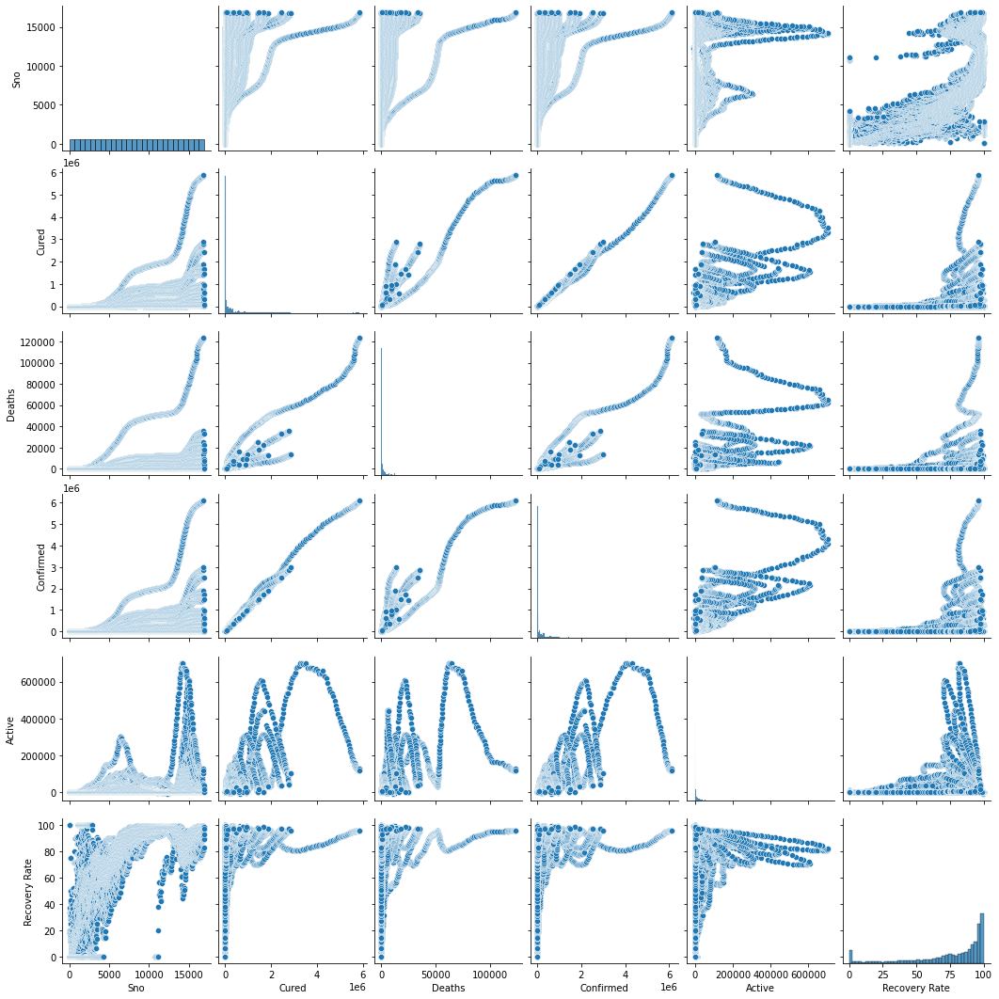

In [19]:
#Pairplot
sns.pairplot(data1)

In [20]:
all_deaths = data1['Deaths'].sum()

In [21]:
#All Cured Cases
data1['Cured'].sum()

3977194136

In [22]:
all_con = data1['Confirmed'].sum()

In [23]:
#All Deaths Cases
all_deaths

58726000

In [24]:
#All Confirmed Cases
all_con

4353478074

In [25]:
recover = all_con - all_deaths

In [26]:
#All Recover Cases
recover

4294752074

### Maharashtra State Data 

In [27]:
data_maha = data1[data1['State/UnionTerritory']=='Maharashtra']


In [28]:
data_maha.replace('-','0',inplace=True)

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:5238: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [29]:
#Maharashtra Data
data_maha.describe()

,Sno,Cured,Deaths,Confirmed,Active,Recovery Rate
count,486.000000,4.860000e+02,486.000000,4.860000e+02,486.000000,486.000000
mean,8191.660494,1.674463e+06,39741.835391,1.870149e+06,155944.508230,70.262077
std,4955.978167,1.710989e+06,31861.231600,1.831266e+06,168833.300211,29.635395
min,77.000000,0.000000e+00,0.000000,2.000000e+00,2.000000,0.000000
25%,3884.000000,1.197165e+05,9299.500000,2.187718e+05,46101.000000,54.608309
50%,8138.500000,1.556812e+06,44884.500000,1.706879e+06,96492.500000,83.593260
75%,12470.000000,2.066541e+06,52468.500000,2.216942e+06,193650.750000,93.463383
max,16835.000000,5.872268e+06,123531.000000,6.113335e+06,701614.000000,96.056702


In [30]:
data_maha

,Sno,Date,Time,State/UnionTerritory,ConfirmedIndianNational,ConfirmedForeignNational,Cured,Deaths,Confirmed,Active,Recovery Rate
76,77,2020-03-09,6:00 PM,Maharashtra,2,0,0,0,2,2,0.000000
91,92,2020-03-10,6:00 PM,Maharashtra,5,0,0,0,5,5,0.000000
97,98,2020-03-11,6:00 PM,Maharashtra,2,0,0,0,2,2,0.000000
120,121,2020-03-12,6:00 PM,Maharashtra,11,0,0,0,11,11,0.000000
133,134,2020-03-13,6:00 PM,Maharashtra,14,0,0,0,14,14,0.000000
...,...,...,...,...,...,...,...,...,...,...,...
16690,16691,2021-07-03,8:00 AM,Maharashtra,0,0,5836920,122353,6079352,120079,96.012207
16726,16727,2021-07-04,8:00 AM,Maharashtra,0,0,5845315,122724,6088841,120802,96.000454
16762,16763,2021-07-05,8:00 AM,Maharashtra,0,0,5848693,123030,6098177,126454,95.908876
16798,16799,2021-07-06,8:00 AM,Maharashtra,0,0,5861720,123136,6104917,120061,96.016375


In [31]:
data_maha.isnull().sum()

Sno                         0
Date                        0
Time                        0
State/UnionTerritory        0
ConfirmedIndianNational     0
ConfirmedForeignNational    0
Cured                       0
Deaths                      0
Confirmed                   0
Active                      0
Recovery Rate               0
dtype: int64

In [32]:
data_maha.fillna(value=0,inplace=True)
data_maha['Active'] = data_maha['Confirmed'] - (data_maha['Cured'] + data_maha['Deaths'])
data_maha['Recovery Rate'] = data_maha['Cured']*100/data_maha['Confirmed']

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:5176: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Tejas\AppData\Local\Temp/ipykernel_7360/1440047907.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Tejas\AppData\Local\Temp/ipykernel_7360/1440047907.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-

In [33]:
#Maximum Deaths,Cured,Confirmed,Recovery Rate,Active
data_maha[data_maha['Deaths'] == data_maha['Deaths'].max()]

,Sno,Date,Time,State/UnionTerritory,ConfirmedIndianNational,ConfirmedForeignNational,Cured,Deaths,Confirmed,Active,Recovery Rate
16834,16835,2021-07-07,8:00 AM,Maharashtra,0,0,5872268,123531,6113335,117536,96.056702


In [34]:
#Minimum Deaths
data_maha[data_maha['Deaths'] == data_maha['Deaths'].min()]

,Sno,Date,Time,State/UnionTerritory,ConfirmedIndianNational,ConfirmedForeignNational,Cured,Deaths,Confirmed,Active,Recovery Rate
76,77,2020-03-09,6:00 PM,Maharashtra,2,0,0,0,2,2,0.0
91,92,2020-03-10,6:00 PM,Maharashtra,5,0,0,0,5,5,0.0
97,98,2020-03-11,6:00 PM,Maharashtra,2,0,0,0,2,2,0.0
120,121,2020-03-12,6:00 PM,Maharashtra,11,0,0,0,11,11,0.0
133,134,2020-03-13,6:00 PM,Maharashtra,14,0,0,0,14,14,0.0
146,147,2020-03-14,6:00 PM,Maharashtra,14,0,0,0,14,14,0.0
153,154,2020-03-15,6:00 PM,Maharashtra,32,0,0,0,32,32,0.0
167,168,2020-03-16,6:00 PM,Maharashtra,32,0,0,0,32,32,0.0


In [35]:
data_maha.isnull().sum()

Sno                         0
Date                        0
Time                        0
State/UnionTerritory        0
ConfirmedIndianNational     0
ConfirmedForeignNational    0
Cured                       0
Deaths                      0
Confirmed                   0
Active                      0
Recovery Rate               0
dtype: int64

In [36]:
px.scatter(x='Date',y='Active',title='Maharashtra Active Cases ',data_frame=data_maha)

In [37]:
px.scatter(x='Date',y='Cured',title='Maharashtra Cured Cases',data_frame=data_maha)

In [38]:
px.scatter(x='Date',y='Recovery Rate',title='Date wise recovery rate',data_frame=data_maha)

In [39]:
px.scatter(x='Date',y='Confirmed',title='Confirmed cases',data_frame=data_maha)

In [40]:
px.bar(x='Date',y='Deaths',title='Deaths',data_frame=data_maha)

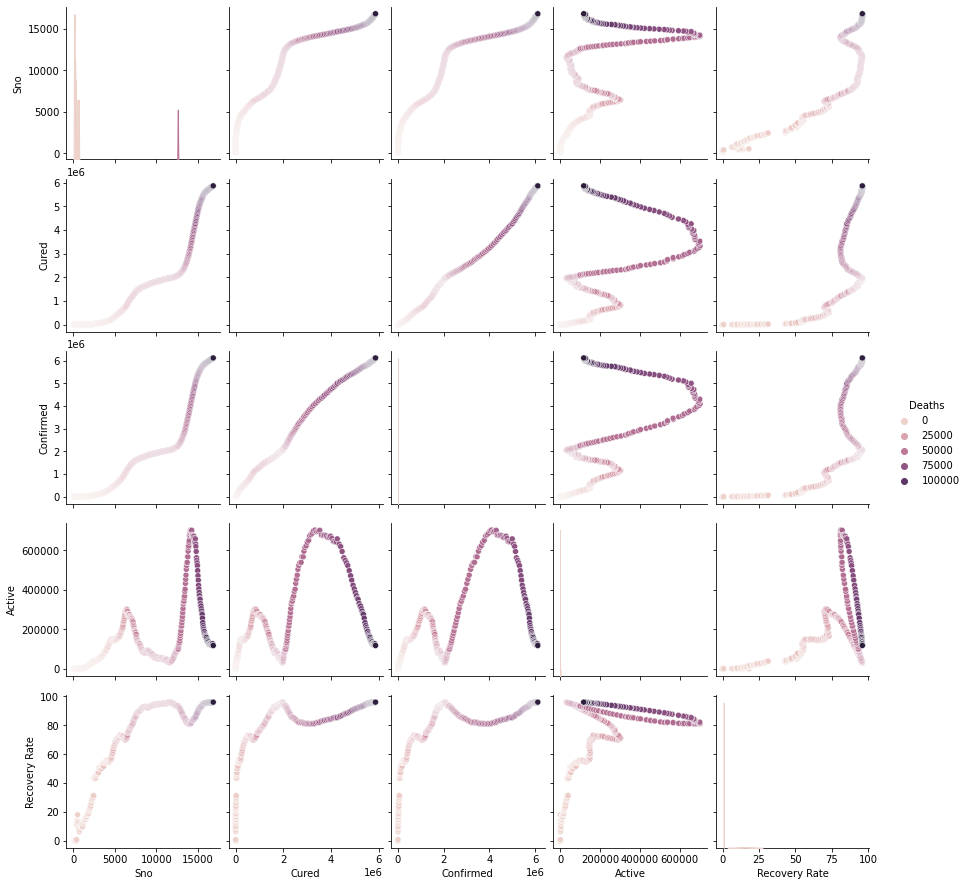

In [41]:
sns.pairplot(data_maha,hue='Deaths',kind='scatter')

In [42]:
#Sum of Deaths
data_maha['Deaths'].sum()

19314532

In [43]:
#Sum of Confirmed
data_maha['Confirmed'].sum()

908892470

In [44]:
#sum of active cases
data_maha['Active'].sum()

75789031

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='Deaths', ylabel='Density'>

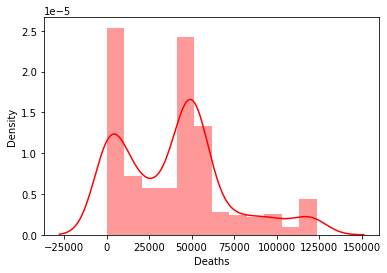

In [45]:
sns.distplot(data_maha['Deaths'],color='red')

In [46]:
fig = px.histogram(x='Deaths',data_frame=data_maha)
fig.update_traces(marker_line_width=1,marker_line_color="red")

In [47]:
px.bar(x='Date',y='Active',data_frame=data_maha,color='Recovery Rate',title="Active Cases and Recovery Rate")

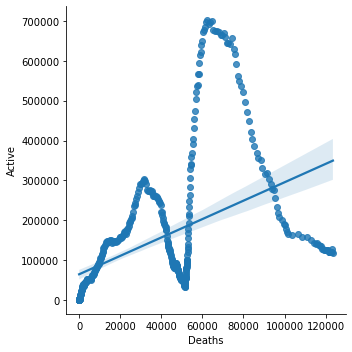

In [48]:
sns.lmplot(x='Deaths',y='Active',data=data_maha)

In [49]:
#top 10 Date by Active State
top_10_Active_cases = data_maha.groupby(['Date'])['Active'].sum()
top_10 = top_10_Active_cases.sort_values(ascending=False).head(10)
pd.DataFrame(top_10)

,Active
Date,
2021-04-23,701614
2021-04-26,700207
2021-04-22,697467
2021-04-25,696298
2021-04-24,693632
2021-04-21,685552
2021-04-20,678198
2021-04-27,676647
2021-04-29,675451


In [50]:
#top 10 Date by Deaths State
top_10_Deaths_cases = data_maha.groupby(['Date'])['Deaths'].sum()
top_10 = top_10_Deaths_cases.sort_values(ascending=False).head(10)
pd.DataFrame(top_10)

,Deaths
Date,
2021-07-07,123531
2021-07-06,123136
2021-07-05,123030
2021-07-04,122724
2021-07-03,122353
2021-07-02,122197
2021-07-01,121945
2021-06-30,121804
2021-06-29,121573


In [51]:
#top 10 Date by Cured State
top_10_Cured_cases = data_maha.groupby(['Date'])['Cured'].sum()
top_10 = top_10_Cured_cases.sort_values(ascending=False).head(10)
pd.DataFrame(top_10)

,Cured
Date,
2021-07-07,5872268
2021-07-06,5861720
2021-07-05,5848693
2021-07-04,5845315
2021-07-03,5836920
2021-07-02,5828535
2021-07-01,5819901
2021-06-30,5809548
2021-06-29,5800925


### Thank You.